In [ ]:
from sklearn.neighbors import KernelDensity
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np
import geopandas as gpd
import xarray as xr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from criminologia_cdmx.etl import *
from criminologia_cdmx.patrones_espacio_temporales import *

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
carpetas = get_historico_carpetas()
carpetas = agregar_categorias_carpetas(carpetas)
carpetas = carpetas.to_crs(32614)
fechas = pd.date_range(start='1/1/2019', end='1/1/2022', freq='M').to_list()
categorias = ["Homicidios dolosos"]
series = serie_mapas_intensidad(carpetas,fechas, ["Homicidios dolosos"], "30 days", 1000, 1000)
series

<xarray.Dataset>
Dimensions:           (latitud: 51, longitud: 42, tiempo: 36)
Coordinates:
  * latitud           (latitud) float64 2.115e+06 2.116e+06 ... 2.165e+06
  * longitud          (longitud) float64 4.642e+05 4.652e+05 ... 5.052e+05
  * tiempo            (tiempo) datetime64[ns] 2019-01-31 ... 2021-12-31
Data variables:
    Serie categorias  (tiempo, latitud, longitud) float64 1.341e-105 ... 3.95...
    Serie base        (tiempo, latitud, longitud) float64 1.85e-72 ... 1.628e-61
    Serie razones     (tiempo, latitud, longitud) float64 7.248e-34 ... 2.427...
    intensidad        (tiempo, latitud, longitud) float64 -0.1878 ... -0.2299
    p_values          (tiempo, latitud, longitud) float64 0.8649 ... 0.8378

<matplotlib.collections.QuadMesh>

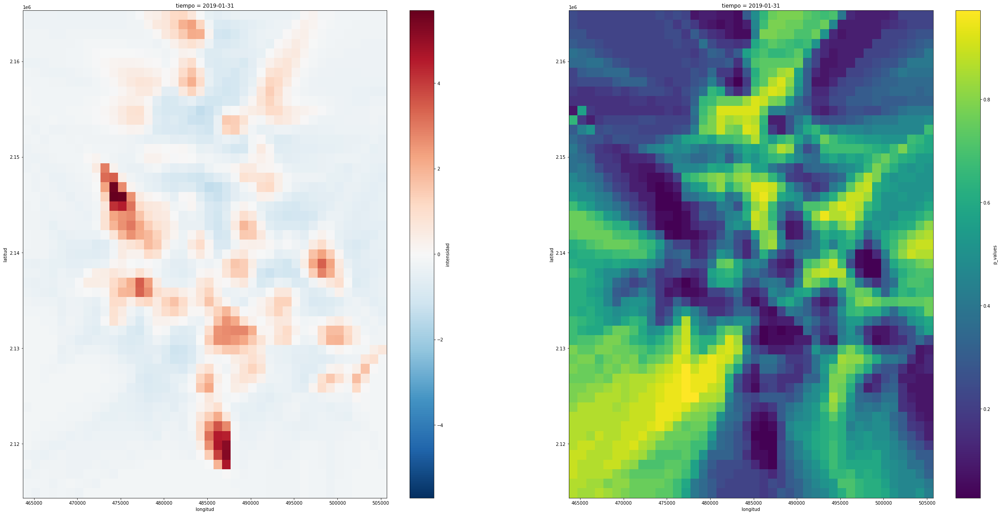

In [ ]:
fig, axes = plt.subplots(1,2,figsize=(40,20))
axes = axes.ravel()
series["intensidad"].isel(tiempo=0).plot(ax=axes[0])
series["p_values"].isel(tiempo=0).plot(ax=axes[1])

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
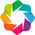

In [ ]:
import holoviews as hv
hv.extension('bokeh')
hv_ds = hv.Dataset(series)

In [ ]:
%%output widget_location='bottom'
# hv.output(widget_location='bottom_left')
int_hv = hv_ds.to(hv.Image, kdims=["longitud", "latitud"], vdims=["intensidad"], dynamic=False)
p_hv = hv_ds.to(hv.Image, kdims=["longitud", "latitud"], vdims=["p_values"], dynamic=False)
img_opts = hv.Options('Image', cmap='Reds')
lo = int_hv + p_hv
lo.opts(img_opts)
lo

:Layout
   .HoloMap.I  :HoloMap   [tiempo]
      :Image   [longitud,latitud]   (intensidad)
   .HoloMap.II :HoloMap   [tiempo]
      :Image   [longitud,latitud]   (p_values)

In [ ]:
import geoviews as gv
from cartopy import crs

In [ ]:
xr_dataset = gv.Dataset(series, kdims=["tiempo", "longitud", "latitud"], vdims=["Serie categorias"], crs=crs.UTM(zone=14))
# xr_dataset.to(gv.Image, ["longitud", "latitud"])

In [ ]:
xr_dataset

:Dataset   [tiempo,longitud,latitud]   (Serie categorias)

In [ ]:
%%output  size=200
xr_dataset.to(gv.Image, ["longitud", "latitud"], "Serie categorias")

:HoloMap   [tiempo]
   :Image   [longitud,latitud]   (Serie categorias)

In [ ]:
%%output  size=200
xr_dataset.to(gv.Image, ["longitud", "latitud"], "Serie categorias").opts(alpha=0.7) * gv.tile_sources.CartoDark()

:HoloMap   [tiempo]
   :Overlay
      .Image.I :Image   [longitud,latitud]   (Serie categorias)
      .WMTS.I  :WMTS   [Longitude,Latitude]

In [ ]:
?gv.Dataset

Init signature: gv.Dataset(data=None, kdims=None, vdims=None, **kwargs)
Docstring:     
params(crs=ClassSelector, extents=Tuple, datatype=List, cdims=Dict, kdims=List, vdims=List, group=String, label=String, name=String)

    Coordinate system aware version of a HoloViews dataset.
    
Parameters of 'Dataset'

Parameters changed from their default values are marked in red.
Soft bound values are marked in cyan.
C/V= Constant/Variable, RO/RW = ReadOnly/ReadWrite, AN=Allow None

Name                        Value                     Type     Bounds   Mode 

group                     'Dataset'                  String             C RW 
label                         ''                     String             C RW 
cdims                   OrderedDict()                 Dict              V RW 
kdims                         []                      List   (0, None)  C RW 
vdims                         []                      List   (0, None)  C RW 
datatype   ['dataframe', 'dictionary', 'grid', '..

In [ ]:
?gv.Image

Init signature: gv.Image(data=None, kdims=None, vdims=None, **kwargs)
Docstring:     
params(crs=ClassSelector, bounds=ClassSelector, rtol=Number, datatype=List, extents=Tuple, cdims=Dict, kdims=List, vdims=List, group=String, label=String, name=String)

    Image represents a 2D array of some quantity with
    some associated coordinates.
    
Parameters of 'Image'

Parameters changed from their default values are marked in red.
Soft bound values are marked in cyan.
C/V= Constant/Variable, RO/RW = ReadOnly/ReadWrite, AN=Allow None

Name                        Value                         Type        Bounds     Mode  

group                      'Image'                       String                  C RW  
label                         ''                         String                  C RW  
cdims                   OrderedDict()                     Dict                   V RW  
kdims          [Dimension('x'), Dimension('y')]           List        (2, 2)     C RW  
vdims               

In [ ]:
series

<xarray.Dataset>
Dimensions:           (latitud: 51, longitud: 42, tiempo: 36)
Coordinates:
  * latitud           (latitud) float64 2.115e+06 2.116e+06 ... 2.165e+06
  * longitud          (longitud) float64 4.642e+05 4.652e+05 ... 5.052e+05
  * tiempo            (tiempo) datetime64[ns] 2019-01-31 ... 2021-12-31
Data variables:
    Serie categorias  (tiempo, latitud, longitud) float64 1.341e-105 ... 3.95...
    Serie base        (tiempo, latitud, longitud) float64 1.85e-72 ... 1.628e-61
    Serie razones     (tiempo, latitud, longitud) float64 7.248e-34 ... 2.427...
    intensidad        (tiempo, latitud, longitud) float64 -0.1878 ... -0.2299
    p_values          (tiempo, latitud, longitud) float64 0.8649 ... 0.8378

In [ ]:
import pygeos as pg

In [ ]:
pg.geos_capi_version

(1, 16, 0)